# NeighborMom() vs AnyMom()

The way a mother is chosen after death has impacts on the result of the simulation. Below are two methods for selecting that individual to reproduce:  weighted sampling by fitness of all individuals (anyMom), or weighted sampling by fitness of only individuals adjacent to the dead one (neighborMom).

In [130]:
function neighborMom(network::NetworkParameters, kID::Int64)
    fitWeights = StatsBase.weights([network.popFitness[kID%100+1], network.popFitness[(kID+98)%100+1]]) #index plus/minus one, loops around 100
    momIndex = (kID + sample([1, -1], fitWeights) + 99)%100 + 1 #have to use (idx +99)%100 + 1 to loop from 100 to 1 properly
    momIndex
end

function anyMom(network::NetworkParameters, kID::Int64)
    network.popFitness[kID] = 0
    fitWeights = StatsBase.weights(network.popFitness)
    momIndex = sample(1:network.popSize, fitWeights)
    resolveLocs(network, kID, momIndex) #updates locations, ensures each individual has a unique location by inserting the child adjacent to the parent and pushing others away 
    momIndex
end

UndefVarError: UndefVarError: NetworkParameters not defined

Both NeighborMom() and AnyMom() serve as different methods replacing FindMom() based on our method of selecting parents. NeighborMom() only compares fitnesses of neighboring individuals, while AnyMom() looks at fitnesses of all individuals in the population. Locations do not need to be separately updated for NeighborMom(), as each individual is automatically adjacent to a parent. 

**Old heatmap for Iterating by Ben/CL**

In [131]:
using JLD2
using StatsBase
using Plots
#backend(:plotly)
using DataFrames
using CSV

In [132]:
function dataRead(data, range, index::Int)
    df = CSV.read(data, DataFrame, delim=",")
    df = df[!, [2, 3, 5, 6, 8, 13, 14, 15, 16, 17, 4, 11, 10, 12, 7, 9, 1]] #used for soring by ben/cl, including graphCalcs
    #df = df[!, [6, 9, 2, 3, 7, 8, 10, 4, 5, 1]] #used for when sorting by pn/r
    #sort!(df, [:pn, :pr]) #used for when sorting by pn/r
    sort!(df, [:ben, :cl])
    dfData = Matrix{Float64}(df)
    dataArr = zeros(range, range, 1) #transforms [range^2 * 10] arr to [range, range, 1] arr
    for(i) in 1:range
        for(j) in 1:range
            dataArr[i, j, 1] = dfData[range*(i-1)+j, index]
        end
    end
    #print(dataArr)
    dataArr
end

function hmap(data::String, range::Int, index::Int, titles::String, cLow::Float64, chI::Float64) 
    #indexes : 1 yidx   2 xidx   3 coopFreq   4 degree   5 fitness  6 pnc_end   7 pnd_end   8 prc_end  9 prd_end  10 shortestPath 11 connComponents 12 meanCCSize 13 largestCC 14 mean connection distance 15 distance  16 inclusion  17 assortment 
    dataArr = dataRead(data, range, index)
    x_axis = String[]
    y_axis = String[]
    for(i) in 1:range #PNC/PND times 10
        push!(x_axis, (string(round((0.4*i/range); digits = 4))))
        push!(y_axis, (string(round((10*i/range); digits = 3))))
    end
    p = heatmap(x_axis, y_axis,  dataArr[:, :, 1]; title = titles, xlabel="CL",ylabel="BEN", clim=(cLow,chI))
    p
end

#redefined hmap() in between runs


hmap (generic function with 2 methods)

# High Strength of Selection, AnyMom(), no Distance-based inheritance
The following two runs were created before distance inheritance was implemented, so do not have the mean connection distance and have to use an older hmap() function.

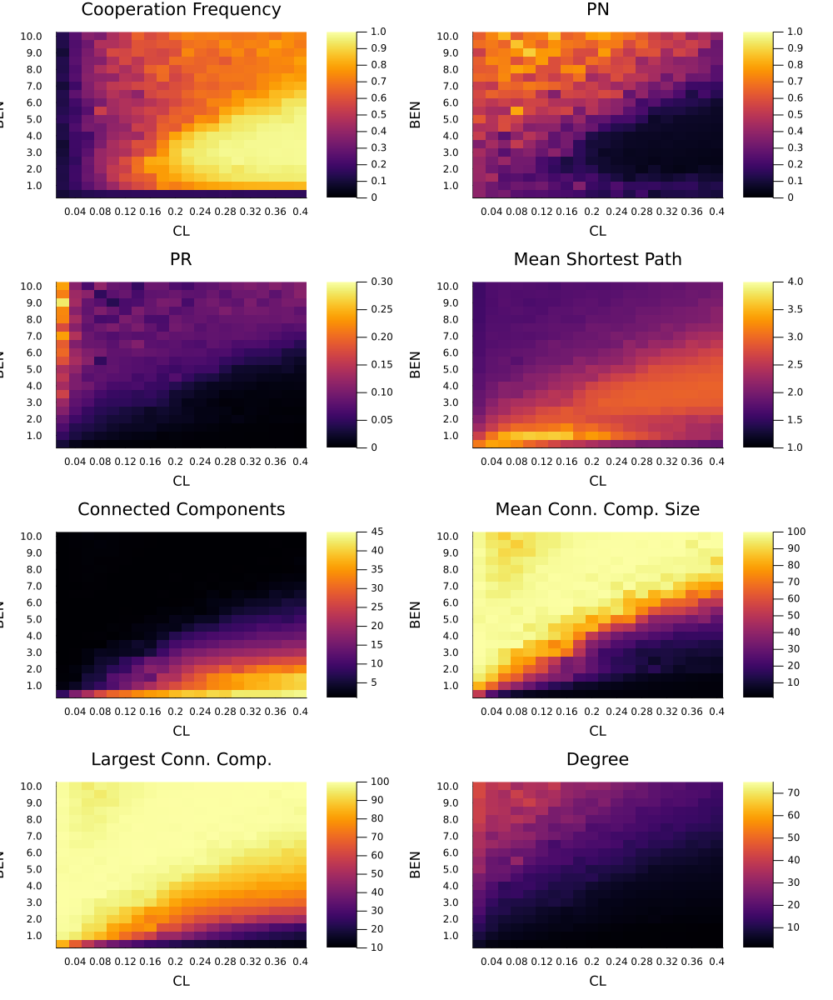

In [133]:
file = "anyMom_no_pnd_new.csv"
fig1hmaps = [hmap(file, 20, 3, "Cooperation Frequency", 0.0, 1.0), 
hmap(file, 20, 6, "PN", 0.0, 1.0), 
hmap(file, 20, 8, "PR", 0.0, 0.3),
hmap(file, 20, 10, "Mean Shortest Path", 1.0, 4.0), 
hmap(file, 20, 11, "Connected Components", 1.0, 45.0), 
hmap(file, 20, 12, "Mean Conn. Comp. Size", 1.0, 100.0), 
hmap(file, 20, 13, "Largest Conn. Comp.", 10.0, 100.0),
hmap(file, 20, 4, "Degree", 1.0, 75.0)] 

plot(fig1hmaps..., colorbar = true, grid=false, layout = (4,2), size = (1000, 1200)) 

**Figure 1** High strength of selection with the mother selected from any individual, pnd and prd not evolving separately. The results above were created with: C=0.5, D=0.0, gen=100000, pn=0.5, distInherit=false, pnd=false, pr=0.0001, prd=false, muP=0.01, delta=0.5, sigmapn=0.01, sigmapr=0.01, reps=10. Initial cooperation frequency was 0.5.

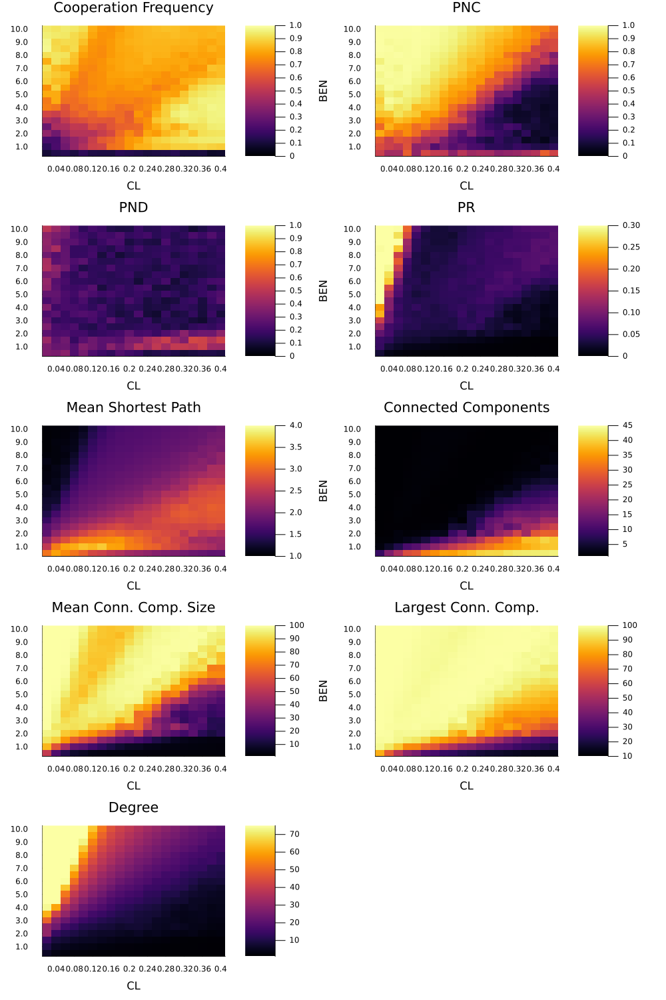

In [134]:
file = "anyMom_pnd_new.csv"
fig1hmaps = [hmap(file, 20, 3, "Cooperation Frequency", 0.0, 1.0), 
hmap(file, 20, 6, "PNC", 0.0, 1.0), 
hmap(file, 20, 7, "PND", 0.0, 1.0),
hmap(file, 20, 8, "PR", 0.0, 0.3),
hmap(file, 20, 10, "Mean Shortest Path", 1.0, 4.0), 
hmap(file, 20, 11, "Connected Components", 1.0, 45.0), 
hmap(file, 20, 12, "Mean Conn. Comp. Size", 1.0, 100.0), 
hmap(file, 20, 13, "Largest Conn. Comp.", 10.0, 100.0),
hmap(file, 20, 4, "Degree", 1.0, 75.0)] 

plot(fig1hmaps..., colorbar = true, grid=false, layout = (5,2), size = (1000, 1500)) 

**Figure 2** High strength of selection with the mother selected from any individual, pnd but not prd evolving separately. The results above were created with: C=0.5, D=0.0, gen=100000, pn=0.5, distInherit=false, pnd=true, pr=0.0001, prd=false, muP=0.01, delta=0.5, sigmapn=0.01, sigmapr=0.01, reps=10. Initial cooperation frequency was 0.5.

**New Heatmap Function**

In [135]:
function dataRead(data, range, index::Int)
    df = CSV.read(data, DataFrame, delim=",")
    df = df[!, [2, 3, 5, 6, 8, 13, 14, 15, 16, 17, 4, 11, 10, 12, 7, 9, 1]] #used for soring by ben/cl, including graphCalcs
    #df = df[!, [6, 9, 2, 3, 7, 8, 10, 4, 5, 1]] #used for when sorting by pn/r
    #sort!(df, [:pn, :pr]) #used for when sorting by pn/r
    sort!(df, [:ben, :cl])
    dfData = Matrix{Float64}(df)
    dataArr = zeros(range, range, 1) #transforms [range^2 * 10] arr to [range, range, 1] arr
    for(i) in 1:range
        for(j) in 1:range
            dataArr[i, j, 1] = dfData[range*(i-1)+j, index]
        end
    end
    #print(dataArr)
    dataArr
end

function hmap(data::String, range::Int, index::Int, titles::String, cLow::Float64, chI::Float64) 
    #indexes : 1 yidx   2 xidx   3 coopFreq   4 degree   5 fitness  6 pnc_end   7 pnd_end   8 prc_end  9 prd_end  10 shortestPath 11 connComponents 12 meanCCSize 13 largestCC 14 mean connection distance 15 distance  16 inclusion  17 assortment 
    dataArr = dataRead(data, range, index)
    x_axis = String[]
    y_axis = String[]
    for(i) in 1:range #PNC/PND times 10
        push!(x_axis, (string(round((0.4*i/range); digits = 4))))
        push!(y_axis, (string(round((10*i/range); digits = 3))))
    end
    p = heatmap(x_axis, y_axis,  dataArr[:, :, 1]; title = titles, xlabel="CL",ylabel="BEN", clim=(cLow,chI))
    p
end

#redefined hmap() in between runs


hmap (generic function with 2 methods)

# High Strength of Selection, NeighborMom(), no Distance-based inheritance

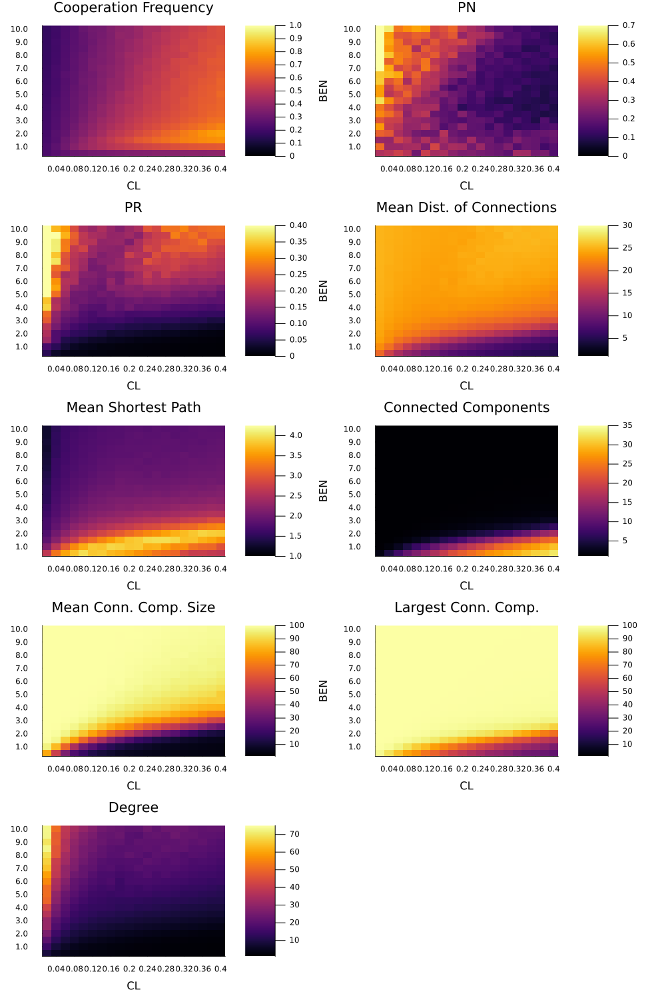

In [136]:
file = "neighbor_mom_no_pnd_fixed.csv"
fig1hmaps = [hmap(file, 20, 3, "Cooperation Frequency", 0.0, 1.0), 
hmap(file, 20, 6, "PN", 0.0, 0.7), 
hmap(file, 20, 8, "PR", 0.0, 0.40),
hmap(file, 20, 14, "Mean Dist. of Connections", 1.0, 30.0),
hmap(file, 20, 10, "Mean Shortest Path", 1.0, 4.25), 
hmap(file, 20, 11, "Connected Components", 1.0, 35.0), 
hmap(file, 20, 12, "Mean Conn. Comp. Size", 1.0, 100.0), 
hmap(file, 20, 13, "Largest Conn. Comp.", 1.0, 100.0),
hmap(file, 20, 4, "Degree", 1.0, 75.0)
]
#,

plot(fig1hmaps..., colorbar = true, grid=false, layout = (5,2), size = (1000, 1500)) 

**Figure 3** High strength of selection with the mother selected from dead individuals' neighbors, pnd and prd not evolving separately. The results above were created with: C=0.5, D=0.0, gen=100000, distInherit=false, distFactor=1.0, pn=0.5, findMom=neighborMom, pnd=false, pr=0.0001, prd=false, muP=0.01, delta=0.5, sigmapn=0.01, sigmapr=0.01, reps=10). Initial cooperation frequency was 0.5 .

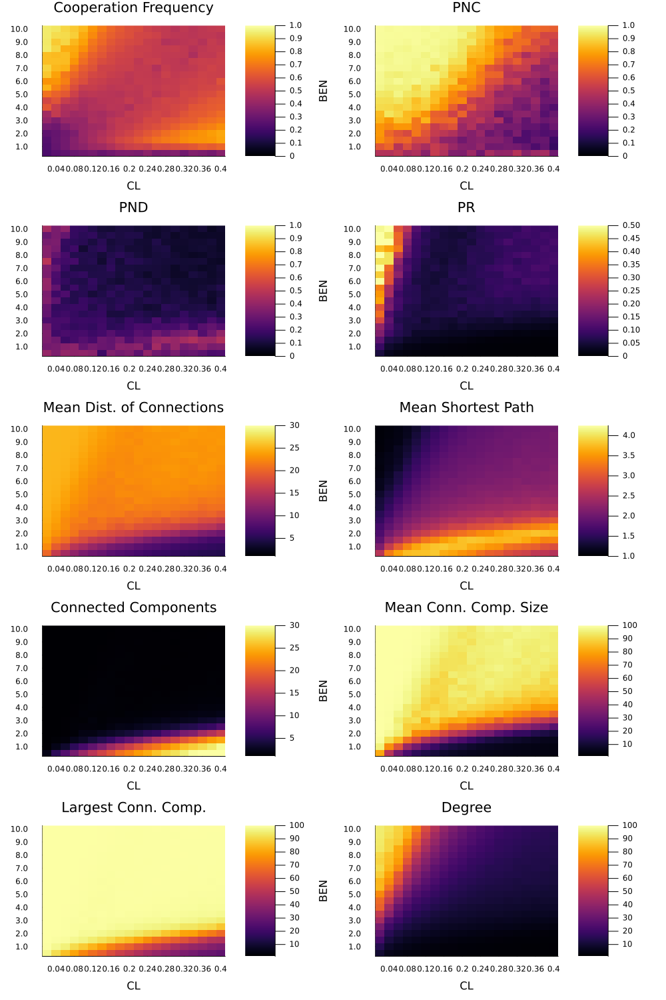

In [137]:
file = "neighbor_mom_pnd.csv"
fig1hmaps = [hmap(file, 20, 3, "Cooperation Frequency", 0.0, 1.0), 
hmap(file, 20, 6, "PNC", 0.0, 1.0), 
hmap(file, 20, 7, "PND", 0.0, 1.0),
hmap(file, 20, 8, "PR", 0.0, 0.50),
hmap(file, 20, 14, "Mean Dist. of Connections", 1.0, 30.0),
hmap(file, 20, 10, "Mean Shortest Path", 1.0, 4.25), 
hmap(file, 20, 11, "Connected Components", 1.0, 30.0), 
hmap(file, 20, 12, "Mean Conn. Comp. Size", 1.0, 100.0), 
hmap(file, 20, 13, "Largest Conn. Comp.", 1.0, 100.0),
hmap(file, 20, 4, "Degree", 1.0, 100.0)
]
#,

plot(fig1hmaps..., colorbar = true, grid=false, layout = (5,2), size = (1000, 1500)) 

**Figure 4** High strength of selection with the mother selected from dead individuals' neighbors, pnd but not prd evolving separately. The results above were created with: C=0.5, D=0.0, gen=100000, distInherit=false, distFactor=1.0, pn=0.5, findMom=neighborMom, pnd=true, pr=0.0001, prd=false, muP=0.01, delta=0.5, sigmapn=0.01, sigmapr=0.01, reps=10. Initial cooperation frequency was 0.5 . 

# Difference Between NeighborMom and anyMom

Heatmap for neighborMom - anyMom

In [161]:
function benClDataRead(data, range, index::Int)
    df = CSV.read(data, DataFrame, delim=",")
    df = df[!, [2, 3, 5, 6, 8, 13, 14, 15, 16, 17, 4, 11, 10, 12, 7, 9, 1]] #used for soring by ben/cl, including graphCalcs
    #df = df[!, [6, 9, 2, 3, 7, 8, 10, 4, 5, 1]] #used for when sorting by pn/r
    #sort!(df, [:pn, :pr]) #used for when sorting by pn/r
    sort!(df, [:ben, :cl])
    dfData = Matrix{Float64}(df)
    dataArr = zeros(range, range, 1) #transforms [range^2 * 10] arr to [range, range, 1] arr
    for(i) in 1:range
        for(j) in 1:range
            dataArr[i, j, 1] = dfData[range*(i-1)+j, index]
        end
    end
    dataArr
end

function benclDataReadMinus(data, data2, range, index::Int)
    df = CSV.read(data, DataFrame, delim=",")
    df = df[!, [2, 3, 5, 6, 8, 13, 14, 15, 16, 17, 4, 11, 10, 12, 7, 9, 1]] #used for soring by ben/cl, including graphCalcs
    sort!(df, [:ben, :cl])
    dfData = Matrix{Float64}(df)
    #print(df)
    dataArr = zeros(range, range, 1) #transforms [range^2 * 10] arr to [range, range, 1] arr
    for(i) in 1:range
        for(j) in 1:range
            dataArr[i, j, 1] = dfData[range*(i-1)+j, index]
        end
    end
    benclData = benClDataRead(data2, range, index)
    dataArr -= benclData
    dataArr
	#return transpose(dataArr[:, :, 1]) #ensures axes are correct
end

function hmap(data::String, data2::String, range::Int, index::Int, titles::String, cLow::Float64, chI::Float64) 
    #indexes : 1 yidx   2 xidx   3 coopFreq   4 degree   5 fitness  6 pnc_end   7 pnd_end   8 prc_end  9 prd_end  10 shortestPath 11 connComponents 12 meanCCSize 13 largestCC 14 mean connection distance 15 distance  16 inclusion  17 assortment 
    dataArr = benclDataReadMinus(data, data2, range, index)
    x_axis = String[]
    y_axis = String[]
    for(i) in 1:range #PNC/PND times 10
        push!(x_axis, (string(round((0.4*i/range); digits = 4))))
        push!(y_axis, (string(round((10*i/range); digits = 3))))
    end
    p = heatmap(x_axis, y_axis,  dataArr[:, :, 1]; title = titles, c=cgrad(:bluesreds), xlabel="CL",ylabel="BEN", clim=(cLow,chI))
    p
end

hmap (generic function with 2 methods)

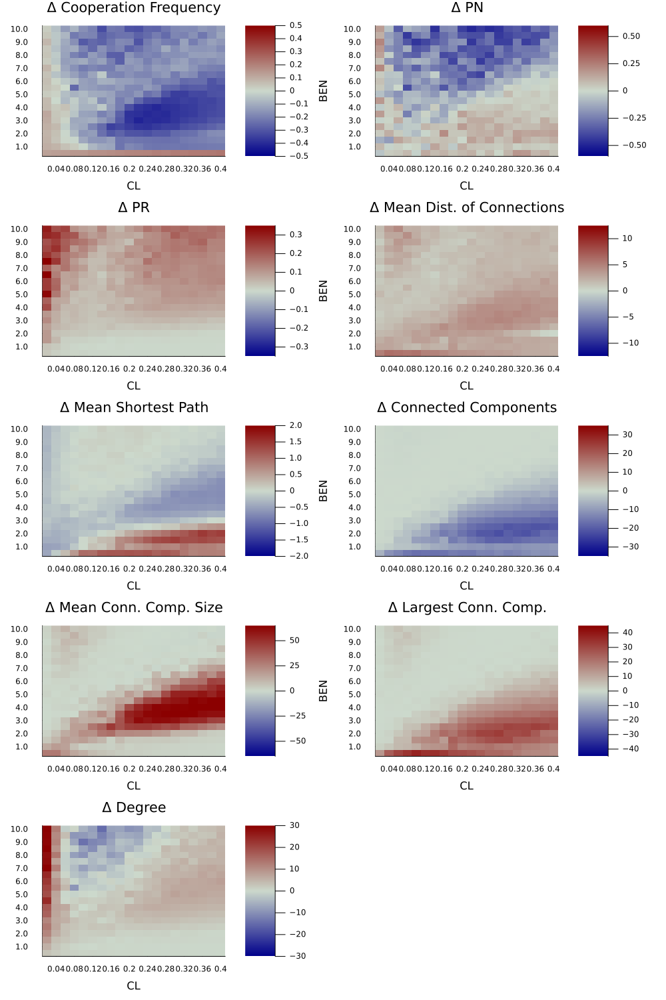

In [172]:
newdata = "neighbor_mom_no_pnd_fixed.csv"
compData = "anyMom_no_pnd_new.csv"

fig1hmaps = [hmap(newdata, compData, 20, 3, "Δ Cooperation Frequency", -0.5, 0.5), 
hmap(newdata, compData, 20, 6, "Δ PN", -0.6, 0.6), 
hmap(newdata, compData, 20, 8, "Δ PR", -0.35, 0.35),
hmap(newdata, compData, 20, 14, "Δ Mean Dist. of Connections", -12.5, 12.5),
hmap(newdata, compData, 20, 10, "Δ Mean Shortest Path", -2.0, 2.0), 
hmap(newdata, compData, 20, 11, "Δ Connected Components", -35.0, 35.0), 
hmap(newdata, compData, 20, 12, "Δ Mean Conn. Comp. Size", -65.0, 65.0), 
hmap(newdata, compData, 20, 13, "Δ Largest Conn. Comp.", -45.0, 45.0),
hmap(newdata, compData, 20, 4, "Δ Degree", -30.0, 30.0)
]

plot(fig1hmaps..., colorbar = true, grid=false, layout = (5,2), size = (1000, 1500)) 

**Figure 5** Difference between Figure 3 and Figure 1 (parents selected from neighbors versus entire population, PND not evolving separately from PNC)

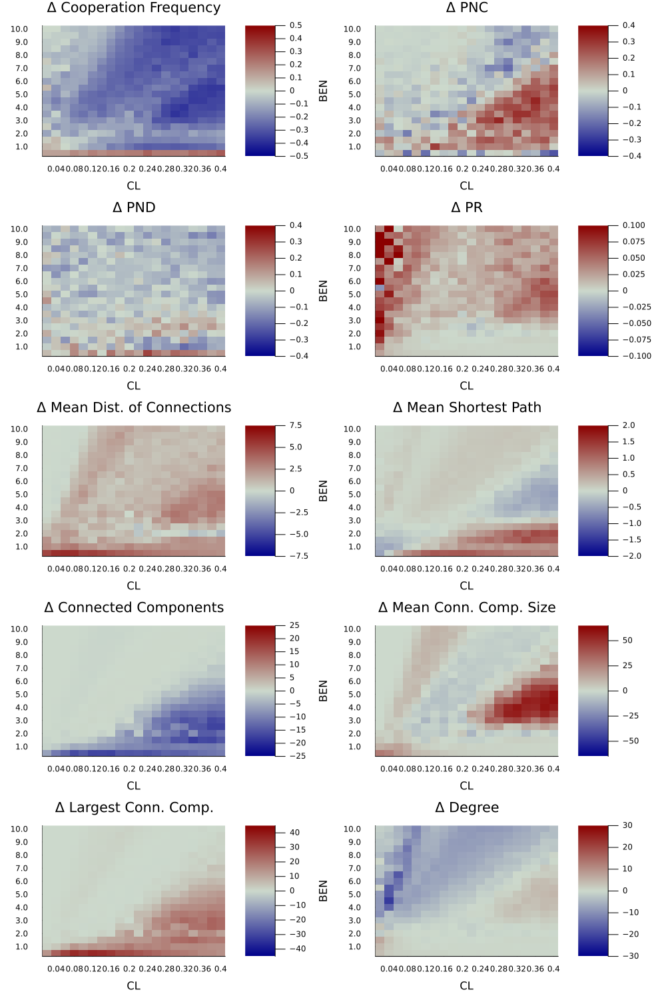

In [168]:
newdata = "neighbor_mom_pnd.csv"
compData = "anyMom_pnd_new.csv"

fig1hmaps = [hmap(newdata, compData, 20, 3, "Δ Cooperation Frequency", -0.5, 0.5), 
hmap(newdata, compData, 20, 6, "Δ PNC", -0.4, 0.4), 
hmap(newdata, compData, 20, 7, "Δ PND", -0.4, 0.4),
hmap(newdata, compData, 20, 8, "Δ PR", -0.1, 0.1),
hmap(newdata, compData, 20, 14, "Δ Mean Dist. of Connections", -7.5, 7.5),
hmap(newdata, compData, 20, 10, "Δ Mean Shortest Path", -2.0, 2.0), 
hmap(newdata, compData, 20, 11, "Δ Connected Components", -25.0, 25.0), 
hmap(newdata, compData, 20, 12, "Δ Mean Conn. Comp. Size", -65.0, 65.0), 
hmap(newdata, compData, 20, 13, "Δ Largest Conn. Comp.", -45.0, 45.0),
hmap(newdata, compData, 20, 4, "Δ Degree", -30.0, 30.0)
]

plot(fig1hmaps..., colorbar = true, grid=false, layout = (5,2), size = (1000, 1500)) 

**Figure 6** Difference between Figure 4 and Figure 2 (parents selected from neighbors versus entire population, PND evolving separately from PNC)

# NeighborRange

The following introduces a new parameter, neighborRange, and modifies neighborMom() as below to allow for an input range to control how many individuals are possible to be selected for the mother.

In [146]:
function neighborMom(network::NetworkParameters, kID::Int64, neighborRange::Int64=1)
    indexes = zeros(Int64, 2*neighborRange)
    fitnesses = zeros(2*neighborRange)
    for(i) in 1:neighborRange
        indexes[i] = (kID-i+99)%100+1 #index minus 1 through neighborRange, loops around 100
        indexes[i+neighborRange] = (kID+i+99)%100+1 #index plus 1 through neighborRange, loops around 100
        fitnesses[i] = network.popFitness[indexes[i]] 
        fitnesses[i+neighborRange] = network.popFitness[indexes[i+neighborRange]]
    end
    fitWeights = StatsBase.weights(fitnesses)
    return sample(indexes, fitWeights) 
end

UndefVarError: UndefVarError: NetworkParameters not defined

Heatmap for iterating by cl/neighborRange (1-50)

In [175]:
function dataRead(data, range, index::Int)
    df = CSV.read(data, DataFrame, delim=",")
    df = df[!, [2, 6, 4, 5, 8, 13, 14, 15, 16, 17, 3, 11, 10, 12, 7, 9, 1]] #used for soring by clratio/distFactor/distNeighborRange, including graphCalcs
    sort!(df, [:distNeighborRange, :cl])
    dfData = Matrix{Float64}(df)
    dataArr = zeros(range, range, 1) #transforms [range^2 * 10] arr to [range, range, 1] arr
    for(i) in 1:range
        for(j) in 1:range
            dataArr[i, j, 1] = dfData[range*(i-1)+j, index]
        end
    end
    dataArr
end

function hmap(data::String, range::Int, index::Int, titles::String, cLow::Float64, chI::Float64) 
    #indexes : 1 yidx   2 xidx   3 coopFreq   4 degree   5 fitness  6 pnc_end   7 pnd_end   8 prc_end  9 prd_end  10 shortestPath 11 connComponents 12 meanCCSize 13 largestCC 14 mean connection distance 15 distance  16 inclusion  17 assortment 
    dataArr = dataRead(data, range, index)
    x_axis = String[]
    y_axis = String[]
    for(i) in 1:range 
        push!(y_axis, (string(Int(floor(-1+51*i/range)))))
        push!(x_axis, (string(round(0.4*i/range; digits = 3))))
    end
    p = heatmap(x_axis, y_axis,  dataArr[:, :, 1]; title = titles, xlabel="CL",ylabel="Neighbor Range", clim=(cLow,chI))
    p
end

hmap (generic function with 2 methods)

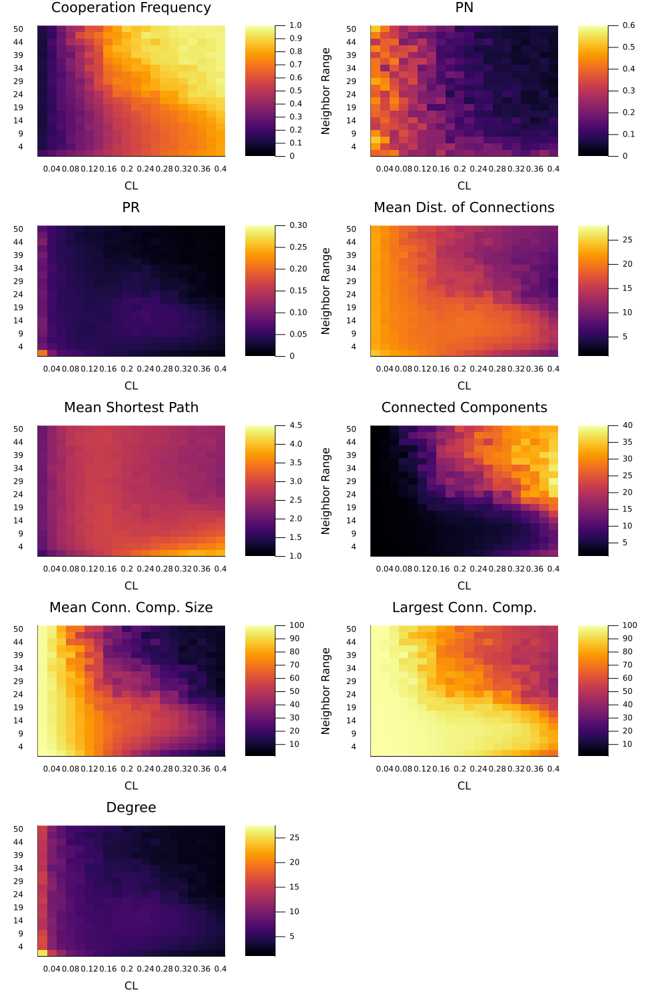

In [148]:
file = "NR-50-no-pnd-fixed-10-reps.csv"
fig1hmaps = [hmap(file, 20, 3, "Cooperation Frequency", 0.0, 1.0), 
hmap(file, 20, 6, "PN", 0.0, 0.6), 
hmap(file, 20, 8, "PR", 0.0, 0.3),
hmap(file, 20, 14, "Mean Dist. of Connections", 1.0, 28.0),
hmap(file, 20, 10, "Mean Shortest Path", 1.0, 4.5), 
hmap(file, 20, 11, "Connected Components", 1.0, 40.0), 
hmap(file, 20, 12, "Mean Conn. Comp. Size", 1.0, 100.0), 
hmap(file, 20, 13, "Largest Conn. Comp.", 1.0, 100.0),
hmap(file, 20, 4, "Degree", 1.0, 27.5)
]
#hmap(file, 20, 4, "Degree", 1.0, 35.0)
plot(fig1hmaps..., colorbar = true, grid=false, layout = (5,2), size = (1000, 1500)) 

**Figure 7** High strength of selection with the mother selected from individuals a distance neighborRange or below from, neither pnd nor prd evolving separately. The results above were created with: B=2.0, C=0.5, D=0.0, gen=100000, dbOrder=deathbirth, distInherit=false, distFactor=1.0, findMom=neighborMom, pn=0.5, pnd=false, pr=0.0001, prd=false, muP=0.01, delta=0.5, sigmapn=0.01, sigmapr=0.01, reps=10. Initial cooperation frequency was 0.5.  
  
  
The exact values of the y-axis are: 1 4 6 9 11 14 16 19 21 24 27 29 32 34 37 39 42 44 47 50 

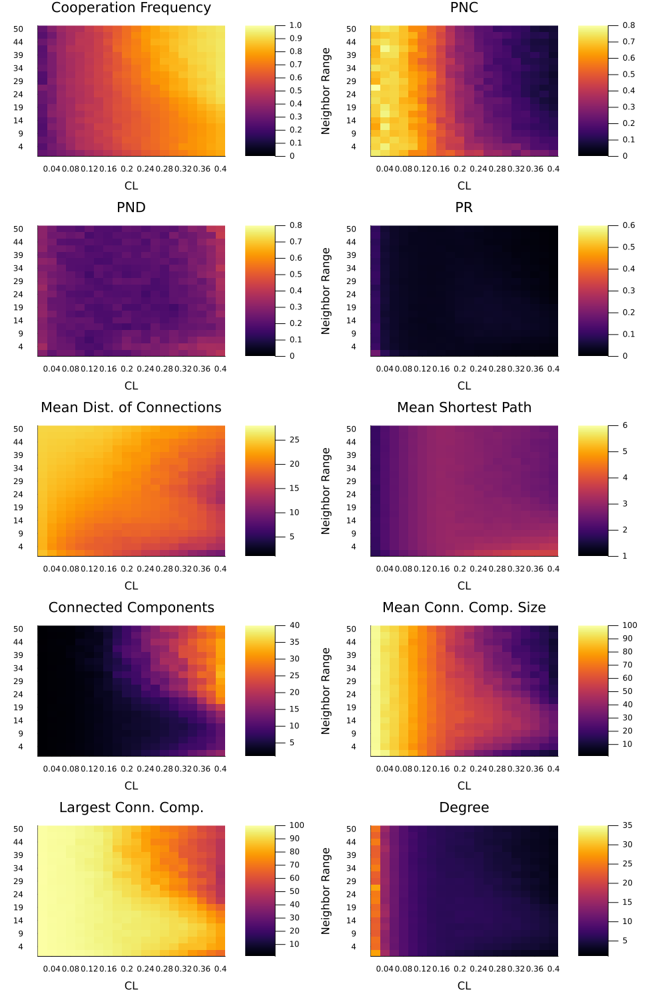

In [176]:
file = "neighborRange-1-50-more-reps.csv"
fig1hmaps = [hmap(file, 20, 3, "Cooperation Frequency", 0.0, 1.0), 
hmap(file, 20, 6, "PNC", 0.0, 0.8), 
hmap(file, 20, 7, "PND", 0.0, 0.8),
hmap(file, 20, 8, "PR", 0.0, 0.6),
hmap(file, 20, 14, "Mean Dist. of Connections", 1.0, 28.0),
hmap(file, 20, 10, "Mean Shortest Path", 1.0, 6.0), 
hmap(file, 20, 11, "Connected Components", 1.0, 40.0), 
hmap(file, 20, 12, "Mean Conn. Comp. Size", 1.0, 100.0), 
hmap(file, 20, 13, "Largest Conn. Comp.", 1.0, 100.0),
hmap(file, 20, 4, "Degree", 1.0, 35.0)
]
#
plot(fig1hmaps..., colorbar = true, grid=false, layout = (5,2), size = (1000, 1500)) 

**Figure 8** High strength of selection with the mother selected from individuals a distance neighborRange or below from, pnd but not prd evolving separately. The results above were created with: B=2.0, C=0.5, D=0.0, gen=100000, distInherit=false, distFactor=1.0, findMom=neighborMom, pn=0.5, pnd=true, pr=0.0001, prd=false, muP=0.01, delta=0.5, sigmapn=0.01, sigmapr=0.01, reps=50. Initial cooperation frequency was 0.5.  
  
  
The exact values of the y-axis are: 1 4 6 9 11 14 16 19 21 24 27 29 32 34 37 39 42 44 47 50 

Finding the difference from both runs with anyMom() and neighborRange from 1-50. New heatmap below.

In [177]:
function benClDataRead(data, range, index::Int)
    df = CSV.read(data, DataFrame, delim=",")
    df = df[!, [3, 2, 5, 6, 8, 13, 14, 15, 16, 17, 4, 11, 10, 12, 7, 9, 1]] #used for soring by ben/cl, including graphCalcs
    #df = df[!, [6, 9, 2, 3, 7, 8, 10, 4, 5, 1]] #used for when sorting by pn/r
    #sort!(df, [:pn, :pr]) #used for when sorting by pn/r
    sort!(df, [:cl, :ben])
    dfData = Matrix{Float64}(df)
    dataArr = zeros(range, range, 1) #transforms [range^2 * 10] arr to [range, range, 1] arr
    for(i) in 1:range
        for(j) in 1:range
            dataArr[i, j, 1] = dfData[range*(i-1)+j, index]
        end
    end
    #print(dataArr)
    dataArr
end

function dataReadMinus(data, data2, range, index::Int)
    df = CSV.read(data, DataFrame, delim=",")
    df = df[!, [2, 6, 4, 5, 8, 13, 14, 15, 16, 17, 3, 11, 10, 12, 7, 9, 1]] #used for soring by clratio/distFactor/distNeighborRange, including graphCalcs
    sort!(df, [:cl, :distNeighborRange])
    dfData = Matrix{Float64}(df)
    #print(df)
    dataArr = zeros(range, range, 1) #transforms [range^2 * 10] arr to [range, range, 1] arr
    for(i) in 1:range
        for(j) in 1:range
            dataArr[i, j, 1] = dfData[range*(i-1)+j, index]
        end
    end
    benclData = benClDataRead(data2, range, index)
    for(i) in 1:range
        #println(benclData[i, 4, 1], " subt from ", dataArr[i, 20, 1], " equals ", dataArr[i, 20, 1]-benclData[i, 4, 1])
        dataArr[i, :, 1] .-= benclData[i, 4, 1]
    end   
	return transpose(dataArr[:, :, 1]) #ensures axes are correct
end

function hmap(data::String, data2::String, range::Int, index::Int, titles::String, cLow::Float64, chI::Float64) 
    #indexes : 1 yidx   2 xidx   3 coopFreq   4 degree   5 fitness  6 pnc_end   7 pnd_end   8 prc_end  9 prd_end  10 shortestPath 11 connComponents 12 meanCCSize 13 largestCC 14 mean connection distance 15 distance  16 inclusion  17 assortment 
    dataArr = dataReadMinus(data, data2, range, index)
    x_axis = String[]
    y_axis = String[]
    for(i) in 1:range 
        push!(y_axis, (string(Int(floor(-1+51*i/range)))))
        push!(x_axis, (string(round(0.4*i/range; digits = 3))))
    end
    p = heatmap(x_axis, y_axis,  dataArr[:, :]; title = titles, c=cgrad(:bluesreds), xlabel="CL",ylabel="Neighbor Range", clim=(cLow,chI))
    p
end

hmap (generic function with 2 methods)

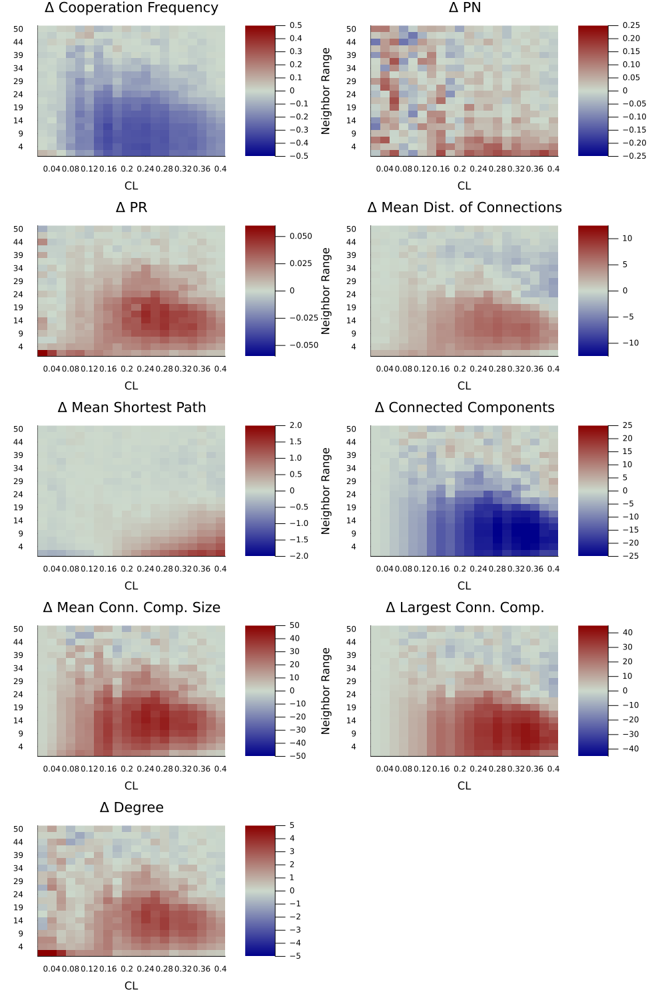

In [178]:
newdata = "NR-50-no-pnd-fixed-10-reps.csv"
compData = "anyMom_no_pnd_new.csv"

fig1hmaps = [hmap(newdata, compData, 20, 3, "Δ Cooperation Frequency", -0.5, 0.5), 
hmap(newdata, compData, 20, 6, "Δ PN", -0.25, 0.25), 
hmap(newdata, compData, 20, 8, "Δ PR", -0.06, 0.06),
hmap(newdata, compData, 20, 14, "Δ Mean Dist. of Connections", -12.5, 12.5),
hmap(newdata, compData, 20, 10, "Δ Mean Shortest Path", -2.0, 2.0), 
hmap(newdata, compData, 20, 11, "Δ Connected Components", -25.0, 25.0), 
hmap(newdata, compData, 20, 12, "Δ Mean Conn. Comp. Size", -50.0, 50.0), 
hmap(newdata, compData, 20, 13, "Δ Largest Conn. Comp.", -45.0, 45.0),
hmap(newdata, compData, 20, 4, "Δ Degree", -5.0, 5.0)
]

plot(fig1hmaps..., colorbar = true, grid=false, layout = (5,2), size = (1000, 1500)) 

**Figure 9** Difference between Figure 7 (with neighborRange) and a run with anyMom at 50 replicate simulations and same inputs, besides findMom method

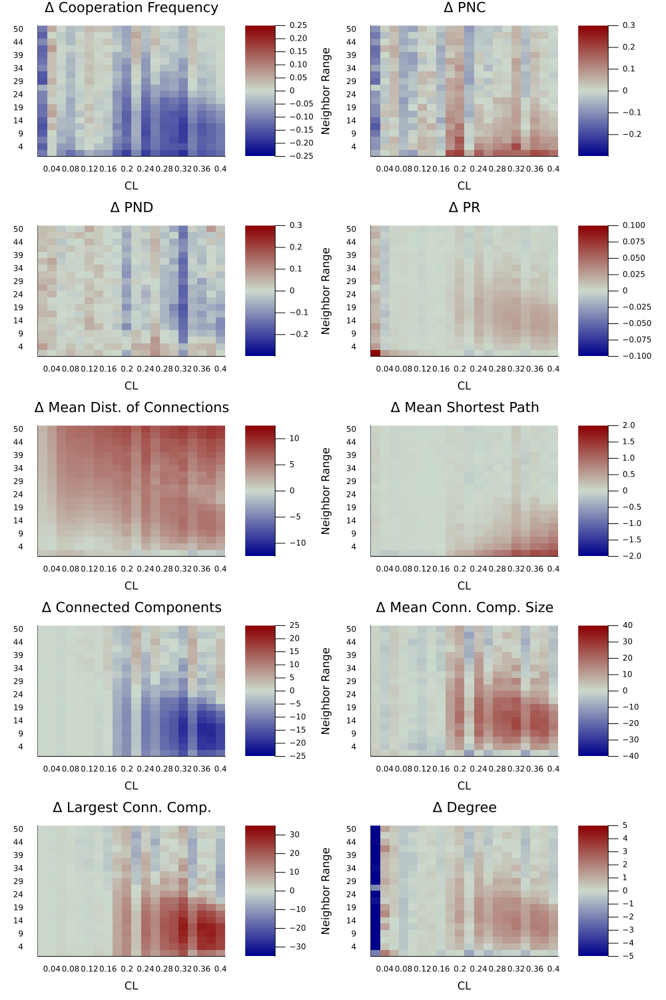

In [174]:
newdata = "neighborRange-1-50-more-reps.csv"
compData = "anyMom_pnd_new.csv"

fig1hmaps = [hmap(newdata, compData, 20, 3, "Δ Cooperation Frequency", -0.25, 0.25), 
hmap(newdata, compData, 20, 6, "Δ PNC", -0.3, 0.3), 
hmap(newdata, compData, 20, 7, "Δ PND", -0.3, 0.3),
hmap(newdata, compData, 20, 8, "Δ PR", -0.1, 0.1),
hmap(newdata, compData, 20, 14, "Δ Mean Dist. of Connections", -12.5, 12.5),
hmap(newdata, compData, 20, 10, "Δ Mean Shortest Path", -2.0, 2.0), 
hmap(newdata, compData, 20, 11, "Δ Connected Components", -25.0, 25.0), 
hmap(newdata, compData, 20, 12, "Δ Mean Conn. Comp. Size", -40.0, 40.0), 
hmap(newdata, compData, 20, 13, "Δ Largest Conn. Comp.", -35.0, 35.0),
hmap(newdata, compData, 20, 4, "Δ Degree", -5.0, 5.0)
#hmap(newdata, compData, 20, 5, "Δ Fitness", -100.0, 100.0)
]

plot(fig1hmaps..., colorbar = true, grid=false, layout = (5,2), size = (1000, 1500)) 

**Figure 10** Difference between Figure 8 (with neighborRange) and a run with anyMom at 50 replicate simulations and same inputs, besides findMom method

# Stabilization Testing

The following were testing iterating by number of generations (50000, 75000, 100000, 150000, 250000) and cl, to see when cooperation frequency stabilizes.

**Heatmap for Iterating by Gen/CL**

In [153]:
function dataRead(data, range, index::Int)
    df = CSV.read(data, DataFrame, delim=",")
    df = df[!, [2, 3, 5, 6, 8, 13, 14, 15, 16, 17, 4, 11, 10, 12, 7, 9, 1]] #used for soring by ben/cl, including graphCalcs
    #df = df[!, [6, 9, 2, 3, 7, 8, 10, 4, 5, 1]] #used for when sorting by pn/r
    #sort!(df, [:pn, :pr]) #used for when sorting by pn/r
    sort!(df, [:ben, :cl])
    dfData = Matrix{Float64}(df)
    dataArr = zeros(range, range, 1) #transforms [range^2 * 10] arr to [range, range, 1] arr
    for(i) in 1:range
        for(j) in 1:range
            dataArr[i, j, 1] = dfData[range*(i-1)+j, index]
        end
    end
    #print(dataArr)
    dataArr
end

function hmap(data::String, range::Int, index::Int, titles::String, cLow::Float64, chI::Float64) 
    #indexes : 1 yidx   2 xidx   3 coopFreq   4 degree   5 fitness  6 pnc_end   7 pnd_end   8 prc_end  9 prd_end  10 shortestPath 11 connComponents 12 meanCCSize 13 largestCC 14 mean connection distance 15 distance  16 inclusion  17 assortment 
    dataArr = dataRead(data, range, index)
    x_axis = String[]
    y_axis = String[]
    gens = [50000, 75000, 100000, 150000, 250000]
    for(i) in 1:range #PNC/PND times 10
        push!(x_axis, (string(round((0.4*i/range); digits = 4))))
        push!(y_axis, (string(gens[i])))
    end
    p = heatmap(x_axis, y_axis,  dataArr[:, :, 1]; title = titles, xlabel="CL",ylabel="Generations", clim=(cLow,chI))
    p
end

#redefined hmap() in between runs


hmap (generic function with 2 methods)

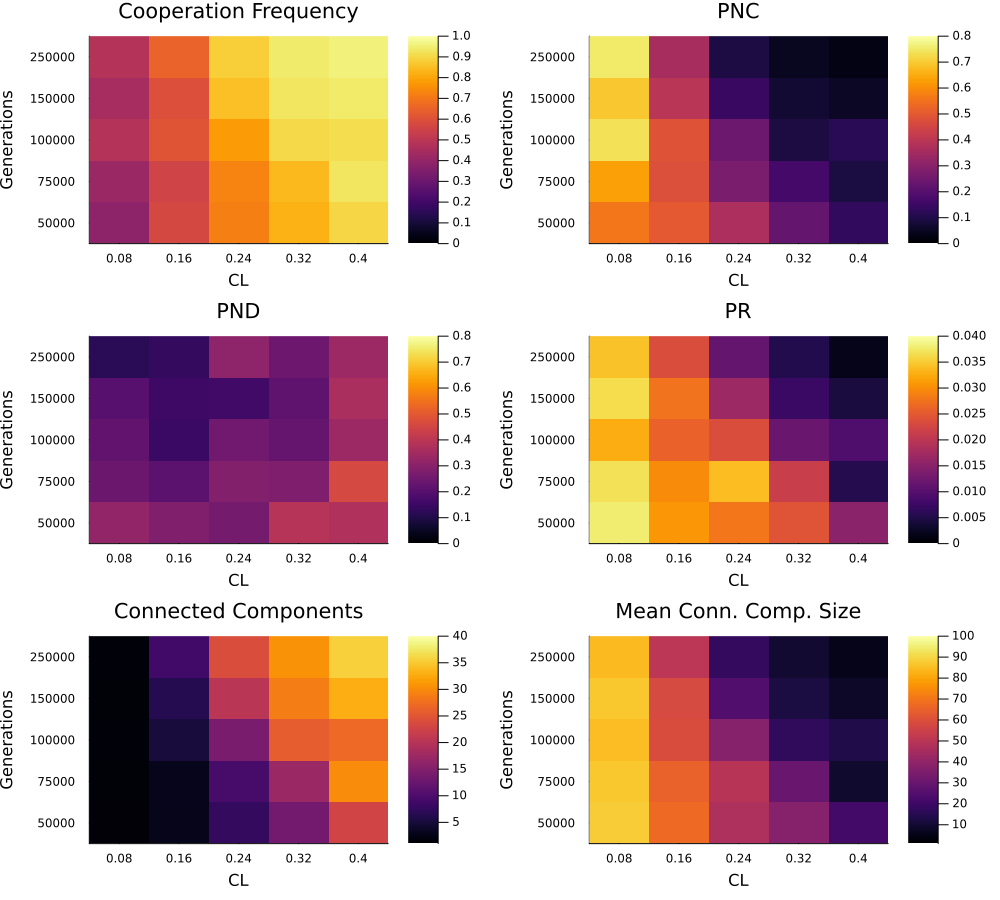

In [154]:
file = "testing-anymom.csv"
fig1hmaps = [hmap(file, 5, 3, "Cooperation Frequency", 0.0, 1.0), 
hmap(file, 5, 6, "PNC", 0.0, 0.8), 
hmap(file, 5, 7, "PND", 0.0, 0.8),
hmap(file, 5, 8, "PR", 0.0, 0.04),
hmap(file, 5, 11, "Connected Components", 1.0, 40.0), 
hmap(file, 5, 12, "Mean Conn. Comp. Size", 1.0, 100.0), 
]
#,

plot(fig1hmaps..., colorbar = true, grid=false, layout = (3,2), size = (1000, 900)) 

**Figure 11** High strength of selection with the mother selected from any individuals, pnd but not prd evolving separately. The results above were created with: B=2.0, C=0.5, D=0.0, CL=pard["cl"], gen=Int(pard["ben"]), findMom=anyMom, distInherit=false, distFactor=0.975, pn=0.5, pnd=true, pr=0.0001, prd=false, muP=0.01, delta=0.5, sigmapn=0.01, sigmapr=0.01, reps=10. Initial cooperation frequency was 0.5

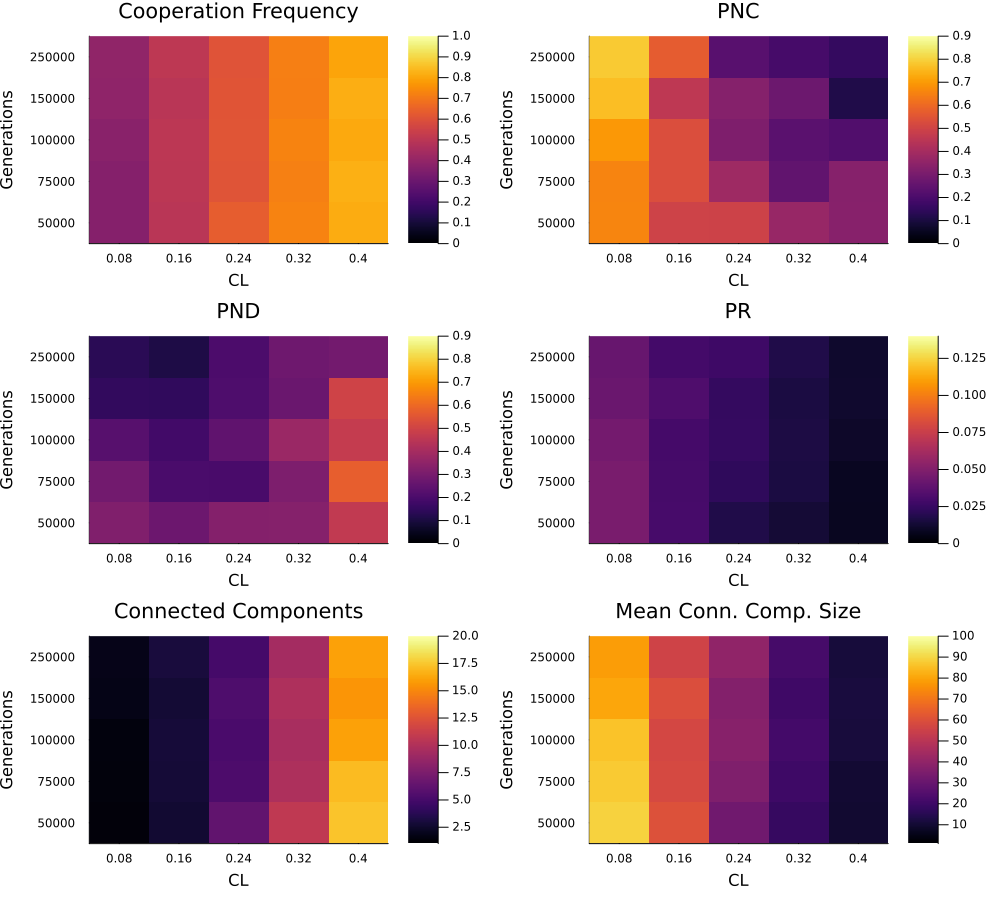

In [155]:
file = "testing-nmom.csv"
fig1hmaps = [hmap(file, 5, 3, "Cooperation Frequency", 0.0, 1.0), 
hmap(file, 5, 6, "PNC", 0.0, 0.9), 
hmap(file, 5, 7, "PND", 0.0, 0.9),
hmap(file, 5, 8, "PR", 0.0, 0.14),
hmap(file, 5, 11, "Connected Components", 1.0, 20.0), 
hmap(file, 5, 12, "Mean Conn. Comp. Size", 1.0, 100.0), 
]
#,

plot(fig1hmaps..., colorbar = true, grid=false, layout = (3,2), size = (1000, 900)) 

**Figure 12** High strength of selection with the mother selected from dead individuals' neighbors, pnd but not prd evolving separately. The results above were created with: B=2.0, C=0.5, D=0.0, CL=pard["cl"], gen=pard["ben"], findMom=neighborMom, distInherit=false, distFactor=0.975, pn=0.5, pnd=true, pr=0.0001, prd=false, muP=0.01, delta=0.5, sigmapn=0.01, sigmapr=0.01, reps=10. Initial cooperation frequency was 0.5 .